In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load
!pip install pyod
import numpy as np
import pandas as pd
from pyod.models.knn import KNN
from matplotlib import pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Dense, Dropout, RepeatVector, TimeDistributed
from sklearn.preprocessing import RobustScaler, MinMaxScaler
from sklearn.decomposition import PCA
import plotly.graph_objs as go
from sklearn.model_selection import GridSearchCV

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 165.8/165.8 kB 6.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... - \ | / done
  Created wheel for pyod: filename=pyod-2.0.2-py3-none-any.whl size=198478 sha256=0232006dc27a80d4f37cdc99b5305eb299676cc46ce4443f9262135946d7444a
  Stored in directory: /root/.cache/pip/wheels/77/c2/20/34d1f15b41b701ba69f42a32304825810d680754d509f91391
Successfully built pyod


2024-09-10 12:48:51.570318: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-09-10 12:48:51.570418: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-09-10 12:48:51.699230: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


/kaggle/input/dataset2/Dataset 2 .csv
/kaggle/input/dataset1/Dataset 1 .csv
/kaggle/input/dataset-1/Dataset_1.csv


In [2]:
# Read the CSV file into a DataFrame
df = pd.read_csv("/kaggle/input/dataset2/Dataset 2 .csv")

# Convert 'Datetime' column to datetime format
df['Datetime'] = pd.to_datetime(df['Date\t'] + ' ' + df['Time'], format='%d-%m-%Y %M:%S.%f')

# Set 'Datetime' as the index
df.set_index('Datetime', inplace=True)

# Drop unnecessary columns
df.drop(['Date\t', 'Time'], axis=1, inplace=True)

# Initialize the cumulative hour difference
cumulative_hour_diff = 0
prev_minute = df.index[0].minute
prev_date = df.index[0].date()
# Function to adjust the hour value
def adjust_hour(index):
    global cumulative_hour_diff, prev_minute, prev_date
    if index.date() != prev_date:
        cumulative_hour_diff = 0  # Reset hour difference at the start of a new day
        prev_date = index.date()
    elif index.minute < prev_minute:
        cumulative_hour_diff += 1
    prev_minute = index.minute
    return index + pd.Timedelta(hours=cumulative_hour_diff)

# Apply the function to adjust the hour values
df.index = df.index.map(adjust_hour)
# Select the desired range (first 169612 rows)
df = df.iloc[:50000, :]

def resample_and_interpolate(group):
    avg_time_diff = group.index.to_series().diff().mean()
    return group.resample(avg_time_diff).mean().interpolate(method='time')

df = df.groupby(df.index.date).apply(resample_and_interpolate)
df.reset_index(level=0, drop=True, inplace=True)
df


,P1,P2,P3,P4,P5,P6,P7,P8,P9
Datetime,,,,,,,,,
2011-10-15 00:39:53.093501721,-0.0469,-0.0385,0.005420,0.011201,38.0,52.000000,0.0,0.0,0.0
2011-10-15 00:40:13.547292334,-0.0469,-0.0385,0.005400,0.011177,38.0,52.000000,0.0,0.0,0.0
2011-10-15 00:40:34.001082947,-0.0469,-0.0385,0.005387,0.011188,38.0,52.000000,0.0,0.0,0.0
2011-10-15 00:40:54.454873560,-0.0469,-0.0385,0.005420,0.011160,38.0,52.300000,0.0,0.0,0.0
2011-10-15 00:41:14.908664173,-0.0469,-0.0385,0.005371,0.011160,38.0,52.454545,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...
2011-10-25 03:45:38.857581759,-0.0469,-0.0385,0.005820,0.011310,37.0,51.777778,0.0,0.0,0.0
2011-10-25 03:45:52.715163726,-0.0469,-0.0385,0.005820,0.011310,37.0,51.833333,0.0,0.0,0.0
2011-10-25 03:46:06.572745693,-0.0469,-0.0385,0.005820,0.011310,37.0,51.888889,0.0,0.0,0.0


In [3]:
# Step 2: Normalize the data
scaler = RobustScaler()
df_scaled = scaler.fit_transform(df)

In [4]:
# Step 3: Initial Anomaly Detection using LSTM Autoencoder
def create_sliding_window(data, window_size):
    X = []
    for i in range(len(data) - window_size + 1):
        X.append(data[i:i + window_size])
    return np.array(X)

window_size = 10
X = create_sliding_window(df_scaled, window_size)

In [5]:
knn = KNN(contamination=0.03)  # Adjust contamination rate as needed
df['anomaly'] = knn.fit_predict(df_scaled)

# Convert anomaly labels: 1 for normal, -1 for anomaly
df['anomaly'] = df['anomaly'].apply(lambda x: 1 if x == 1 else 0)

/opt/conda/lib/python3.10/site-packages/sklearn/utils/deprecation.py:86: FutureWarning: Function fit_predict is deprecated
  warnings.warn(msg, category=FutureWarning)


In [6]:
# Step 5: Identify Longest Span Without Anomalies
clean_spans = []
current_span = []

for i in range(len(df)):
    if df['anomaly'].iloc[i] == 0:  # 0 indicates normal data
        current_span.append(df.iloc[i])
    else:
        if len(current_span) > 0:
            clean_spans.append(pd.DataFrame(current_span))
            current_span = []

if len(current_span) > 0:
    clean_spans.append(pd.DataFrame(current_span))

In [7]:
# Find the longest span
longest_span = max(clean_spans, key=len).drop(columns=['anomaly'])
longest_span_scaled = scaler.transform(longest_span)
longest_span

,P1,P2,P3,P4,P5,P6,P7,P8,P9
2011-10-17 15:42:40.756092500,-0.0469,-0.0385,0.005541,0.01096,37.0,52.0,0.0,0.0,0.0
2011-10-17 15:42:55.240281000,-0.0469,-0.0385,0.005551,0.01096,37.0,52.0,0.0,0.0,0.0
2011-10-17 15:43:09.724469500,-0.0469,-0.0385,0.005528,0.01096,37.0,52.0,0.0,0.0,0.0
2011-10-17 15:43:24.208658000,-0.0469,-0.0385,0.005570,0.01096,37.0,52.0,0.0,0.0,0.0
2011-10-17 15:43:38.692846500,-0.0469,-0.0385,0.005570,0.01096,37.0,52.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...
2011-10-18 06:47:09.208730004,-0.0469,-0.0385,0.005770,0.01131,37.0,52.0,0.0,0.0,0.0
2011-10-18 06:47:19.895173018,-0.0469,-0.0385,0.005770,0.01131,37.0,52.0,0.0,0.0,0.0
2011-10-18 06:47:30.581616032,-0.0469,-0.0385,0.005770,0.01131,37.0,52.0,0.0,0.0,0.0
2011-10-18 06:47:41.268059046,-0.0469,-0.0385,0.005770,0.01131,37.0,52.0,0.0,0.0,0.0


In [8]:
# Step 6: Create Sliding Windows for Clean Data
X_clean = create_sliding_window(longest_span_scaled, window_size)

In [9]:
# Step 7: Train the LSTM Autoencoder on Clean Data
autoencoder_clean = Sequential([
    LSTM(100, activation='relu', input_shape=(window_size, longest_span_scaled.shape[1])),
    RepeatVector(window_size),
    LSTM(100, activation='relu', return_sequences=True),
    TimeDistributed(Dense(longest_span_scaled.shape[1]))
])
autoencoder_clean.compile(optimizer='adam', loss='mse')

X_clean_train = X_clean.reshape((X_clean.shape[0], window_size, longest_span_scaled.shape[1]))
history_clean = autoencoder_clean.fit(X_clean_train, X_clean_train, epochs=10, batch_size=32, validation_split=0.2, shuffle=False)

/opt/conda/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/10
42/97 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.2867

I0000 00:00:1725972559.811630      82 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


97/97 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.2627 - val_loss: 0.0980
Epoch 2/10
97/97 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0746 - val_loss: 0.0428
Epoch 3/10
97/97 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0454 - val_loss: 0.0264
Epoch 4/10
97/97 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0289 - val_loss: 0.0759
Epoch 5/10
97/97 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0471 - val_loss: 0.0356
Epoch 6/10
97/97 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0245 - val_loss: 0.0198
Epoch 7/10
97/97 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0222 - val_loss: 0.0183
Epoch 8/10
97/97 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0179 - val_loss: 0.0170
Epoch 9/10
97/97 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0159 - val_loss: 0.0139
Epoch 10/10
97/97 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0141 - val_loss: 0.0267


In [10]:
# Step 8: Validate and Predict Anomalies on Full Data
predictions = []

for date, group in df.groupby(df.index.date):
    last_index = group.index[-1]
    initial_window = df_scaled[:20].reshape((1, 20, df_scaled.shape[1]))
    
    # Add the first 20 readings to predictions
    for i in range(20):
        predictions.append(initial_window[0, i, :])
    
    for i in range(20, len(group)):
        window = np.array(predictions[-20:]).reshape((1, 20, df_scaled.shape[1]))
        next_value = autoencoder_clean.predict(window)
        predictions.append(next_value[0, -1, :])
        current_time = group.index[i]
        print(f"Predicting for time: {current_time}, Last time to be predicted: {last_index}")
        if current_time >= last_index:
            break

predictions = np.array(predictions)

# Ensure predictions has the same length as df_scaled
if len(predictions) < len(df_scaled):
    predictions = np.pad(predictions, ((0, len(df_scaled) - len(predictions)), (0, 0)), mode='constant')

print(f"Total predictions: {len(predictions)}, Expected: {len(df_scaled)}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 789ms/step
Predicting for time: 2011-10-15 00:46:42.169313981, Last time to be predicted: 2011-10-15 06:57:35.893500925
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Predicting for time: 2011-10-15 00:47:02.623104594, Last time to be predicted: 2011-10-15 06:57:35.893500925
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Predicting for time: 2011-10-15 00:47:23.076895207, Last time to be predicted: 2011-10-15 06:57:35.893500925
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Predicting for time: 2011-10-15 00:47:43.530685820, Last time to be predicted: 2011-10-15 06:57:35.893500925
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Predicting for time: 2011-10-15 00:48:03.984476433, Last time to be predicted: 2011-10-15 06:57:35.893500925
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Predicting for time: 2011-10-15 00:48:24.438267046, Last time to be predicted: 2011-10-15 06:57:35.893500925
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Predicting for time: 2011-10-15 00:48:44.892057659, Last time to be predicted: 

In [11]:
predictions.shape

(50000, 9)

In [12]:
# Calculate the rate of approach to the anomalous value and predict the time of the first anomalous reading
anomaly_threshold = 0.80  # 80% anomaly threshold
deviation_threshold = 0.50  # 50% deviation threshold

errors = np.mean(np.abs(predictions - df_scaled), axis=1)
anomalies = errors > anomaly_threshold
anomalies

array([False, False, False, ..., False, False, False])

In [13]:
upper_limit = np.max(longest_span_scaled, axis=0)
time_diffs = df.index.to_series().diff().dt.total_seconds().fillna(0)
# Monitor and calculate rate of approach to anomalies
def detect_anomalies(data, upper_limit, deviation_threshold):
    monitored = []
    for i in range(len(data)):
        for feature_idx in range(data.shape[1]):  # Iterate over each feature
            if data[i, feature_idx] > upper_limit[feature_idx] * (1 + deviation_threshold):
                # Store both index and feature that is heading toward an anomaly
                monitored.append((i, feature_idx))
    return monitored

monitored_indices = detect_anomalies(df_scaled, upper_limit, deviation_threshold)

def calculate_rate_of_approach(data, index, feature_idx, time_diffs):
    rates = []
    if index + 1 < len(data):
        # Convert the time difference to seconds
        time_diff = time_diffs.iloc[index]  # Get the time difference in seconds
        if time_diff > 0:  # Ensure the time difference is positive to avoid division by zero
            # Only calculate the rate for the specific feature
            rate = (data[index + 1, feature_idx] - data[index, feature_idx]) / time_diff
            rates.append(rate)
    return np.array(rates)

# Initialize variables
predicted_timestamps = []
in_anomaly = False
anomaly_start_index = None

# Iterate over the monitored indices and features
for index, feature_idx in monitored_indices:
    rates = calculate_rate_of_approach(df_scaled, index, feature_idx, time_diffs)
    
    # Check if rates are valid
    for rate in rates:
        if np.issubdtype(type(rate), np.number) and rate != 0 and not np.isclose(rate, 0):
            # Calculate the target value for 80% above the upper limit for the current feature
            target_value = upper_limit[feature_idx] * (1 + anomaly_threshold)

            # Calculate time to reach the target value for the current feature
            time_to_anomaly = (target_value - df_scaled[index, feature_idx]) / rate
            
            # Only proceed if the time_to_anomaly is positive
            if time_to_anomaly > 0:
                # Determine the predicted timestamp for the anomaly
                predicted_timestamp = df.index[index] + pd.Timedelta(seconds=time_to_anomaly)
                
                # Check if we're currently in an anomaly period
                if not in_anomaly:
                    # Start of a new anomaly period
                    predicted_timestamps.append(predicted_timestamp)
                    in_anomaly = True
                    anomaly_start_index = index
                break
    else:
        # End of an anomaly period if we exit the loop without finding valid rates
        if in_anomaly:
            in_anomaly = False
            anomaly_start_index = None

# Ensure we handle the end of the data
if in_anomaly:
    predicted_timestamps.append(df.index[anomaly_start_index])

In [14]:
len(predicted_timestamps)

401

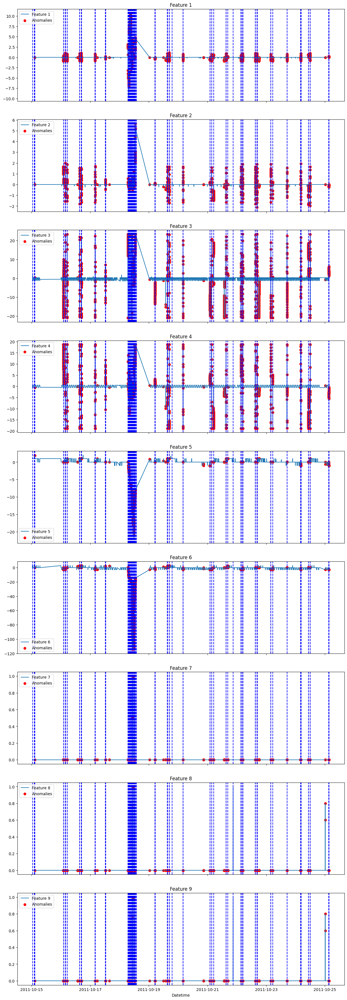

In [15]:
num_features = df_scaled.shape[1]
fig, axes = plt.subplots(num_features, 1, figsize=(15, 5 * num_features), sharex=True)

for i in range(num_features):
    axes[i].plot(df.index, df_scaled[:, i], label=f'Feature {i+1}')
    axes[i].scatter(df.index[df['anomaly'] == 1], df_scaled[df['anomaly'] == 1, i], color='red', label='Anomalies')
    for timestamp in predicted_timestamps:
        axes[i].axvline(x=timestamp, color='blue', linestyle='--')
    axes[i].set_title(f'Feature {i+1}')
    axes[i].legend()

plt.xlabel('Datetime')
plt.show()